In [1]:
from pathlib import Path

import pandas as pd
import numpy as np
import datetime as dt

import plotly.express as px
import plotly.io as pio
import matplotlib.pyplot as plt
import seaborn as sns

from ray import tune
from ray.air import session
from ray.train import Checkpoint

from recsys4daos.utils.notebooks import download_plotly, download_matplotlib
import paths

pio.templates.default = 'seaborn'
sns.set_theme()

In [2]:
SPLITS_FREQ = 'W-THU'
SPLITS_NORMALIZE = True # Wether or not to move everything to 00:00
CUTOFF_DATE = dt.datetime.fromisoformat("2023-07-29")
RAY_RESULTS_PATH = '~/ray_results3.11'
ORG_NAME = 'Decentraland'
LAST_FOLDS = 10 # Used for asserts
LAST_FOLD_DATE_STR: str = '2023-07-13'

OPTIM_METRIC = 'map@10'
OPTIM_MODE = 'max'

SAMPLES_PER_SPLIT: int = 100 # See 07_microsoft_tuning.ipynb

In [3]:
# Parameters
EXECUTION_ID = "2024-09-04T10:00"
ORG_NAME = "Decentraland"
SPLITS_FREQ = "W-THU"
LAST_FOLDS = 10
SPLITS_NORMALIZE = True
LAST_FOLD_DATE_STR = "2023-07-13"


In [4]:
RAY_RESULTS_PATH = Path(RAY_RESULTS_PATH).expanduser()
assert RAY_RESULTS_PATH.is_dir()

## Get ray results

In [5]:
fname_glob = paths.lightgcn_ray_tune_fname(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, OPTIM_METRIC, fold='glob')
fname_glob

'Decentraland/LightGCN_W-THU_normalize_map@10_fold=[0-9]*'

In [6]:
last_experiments = sorted(RAY_RESULTS_PATH.glob(fname_glob))
print(f"Found {len(last_experiments)} folds")

class TrainLightGCN:
    def __init__(self):
        raise NotImplementedError

tuners = [ tune.Tuner.restore(str(l), TrainLightGCN) for l in last_experiments ]
result_grids = [ tuner.get_results() for tuner in tuners ]
assert len(result_grids) == LAST_FOLDS, f"Waiting for full experiment to run {len(result_grids)}/{LAST_FOLDS}"

for i, rg in enumerate(result_grids):
    print(f"Fold: {i}, {rg.num_terminated} finished, {rg.num_errors} errors")
    assert rg.num_terminated == SAMPLES_PER_SPLIT
    assert rg.num_errors == 0, "There should be no errors"

Found 10 folds


Fold: 0, 100 finished, 0 errors
Fold: 1, 100 finished, 0 errors
Fold: 2, 100 finished, 0 errors
Fold: 3, 100 finished, 0 errors
Fold: 4, 100 finished, 0 errors
Fold: 5, 100 finished, 0 errors
Fold: 6, 100 finished, 0 errors
Fold: 7, 100 finished, 0 errors
Fold: 8, 100 finished, 0 errors
Fold: 9, 100 finished, 0 errors


In [7]:
# Checking data from just one experiment
pd.concat(result_grids[0]._experiment_analysis.trial_dataframes.values())

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,node_ip,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,256,5,0.690791,0.690743,0.000048,0.007194,0.021583,0.021583,0.021583,0.359712,...,147.96.81.131,2.481074,1,8,15,3,0.0002,0.000128,30d,2023-05-11T00:00:00
1,256,10,0.686446,0.686387,0.000060,0.002398,0.007194,0.007194,0.007194,0.294964,...,147.96.81.131,4.457034,2,8,15,3,0.0002,0.000128,30d,2023-05-11T00:00:00
2,256,15,0.677144,0.677066,0.000078,0.009592,0.021583,0.021583,0.021583,0.323741,...,147.96.81.131,6.323885,3,8,15,3,0.0002,0.000128,30d,2023-05-11T00:00:00
3,256,20,0.661877,0.661772,0.000104,0.017986,0.035971,0.035971,0.035971,0.309353,...,147.96.81.131,8.104960,4,8,15,3,0.0002,0.000128,30d,2023-05-11T00:00:00
4,256,25,0.640315,0.640177,0.000137,0.022482,0.050360,0.050360,0.050360,0.302158,...,147.96.81.131,9.910706,5,8,15,3,0.0002,0.000128,30d,2023-05-11T00:00:00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,256,180,0.000462,0.000071,0.000391,0.032554,0.071942,0.071942,0.071942,0.446043,...,147.96.81.131,182.330605,36,8,393,2,0.0018,0.000002,90d,2023-05-11T00:00:00
36,256,185,0.000460,0.000079,0.000381,0.023921,0.057554,0.057554,0.057554,0.424460,...,147.96.81.131,187.013920,37,8,393,2,0.0018,0.000002,90d,2023-05-11T00:00:00
37,256,190,0.000450,0.000079,0.000371,0.027518,0.057554,0.057554,0.057554,0.417266,...,147.96.81.131,192.249037,38,8,393,2,0.0018,0.000002,90d,2023-05-11T00:00:00
38,256,195,0.000470,0.000108,0.000362,0.033993,0.064748,0.064748,0.064748,0.424460,...,147.96.81.131,197.397625,39,8,393,2,0.0018,0.000002,90d,2023-05-11T00:00:00


## Create dataframe with all results

In [8]:
# Read dataframe and drop some unneeded columns
# rdf = pd.concat([rg.get_dataframe(TARGET, 'max') for rg in result_grids ])
rdf = pd.concat([ pd.concat(rg._experiment_analysis.trial_dataframes.values()) for rg in result_grids ])

drop_cols = [
    'timestamp', 'node_ip', 'pid', 'hostname', 'time_since_restore', # 'checkpoint_dir_name', 'trial_id', # 'logdir'
    'model_recall', 'model_ndcg', 'model_precision', 'model_map', 
    'time_train', 'time_eval', 'time_total_s', 'time_this_iter_s',
    'training_iteration', 'iterations_since_restore',
    # 'recall@5', 'map@5', 'recall@10', 'map@10',
]
rdf = rdf.drop(columns=drop_cols)
rdf = rdf.drop(columns=['date']).rename(columns={'config/__trial_index__': 'config/fold', 'iteration':'config/iteration'})
rdf['config/fold'] = pd.to_datetime(rdf['config/fold'])
# rdf = rdf[rdf['done']]
print(rdf.columns)

for c in ['config/batch_size']: #, 'config/embedding_dim']:
    rdf[c] = 2**rdf[c]

# rdf[(rdf['config/fold'] >= 1) & (rdf['iteration'] > 10)].sort_values('precision@5').tail()
# Display some results
rdf.sort_values(OPTIM_METRIC).tail()

Index(['real_batch_size', 'config/iteration', 'loss', 'mf_loss', 'emb_loss',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_rec', 'time_total_train', 'time_total_test', 'done', 'trial_id',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_size',
       'config/fold'],
      dtype='object')


,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
26,512,135,0.385907,0.384712,0.001195,0.584746,0.437853,0.345763,0.265254,0.192655,...,8.000835,False,d29a0404,512,1,3,0.0156,0.000036,90d,2023-06-08
13,512,70,0.384231,0.383475,0.000756,0.584746,0.412429,0.344068,0.266102,0.192655,...,3.702486,False,d29a0404,512,1,3,0.0156,0.000036,90d,2023-06-08
25,512,130,0.378800,0.377639,0.001162,0.576271,0.460452,0.345763,0.260169,0.192655,...,7.787942,False,d29a0404,512,1,3,0.0156,0.000036,90d,2023-06-08
2,512,15,0.412225,0.411806,0.000419,0.584746,0.443503,0.361017,0.257627,0.192655,...,0.709356,False,d29a0404,512,1,3,0.0156,0.000036,90d,2023-06-08
20,512,105,0.387119,0.386120,0.000998,0.593220,0.437853,0.345763,0.266102,0.192655,...,6.125229,False,d29a0404,512,1,3,0.0156,0.000036,90d,2023-06-08


### Define K_RECOMMENDATIONS

In [9]:
K_RECOMMENDATIONS = { int(c.split('@')[1]) for c in rdf.columns if '@' in c }
K_RECOMMENDATIONS

{1, 3, 5, 10, 15, 100}

## Assert that every experiment was completed

In [10]:
_config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

# _s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
# print(_s)

# Cuidado, no es aleatorio sin reemplazamiento, por lo que
# alguna config, por casualidad, puede estar repetida y es necesario
# usar trial_id
_config_cols.append('trial_id')

_s = rdf.groupby(_config_cols).size().groupby('config/fold').size()
print(_s)
assert all(_s == SAMPLES_PER_SPLIT), "Insufficient number of samples" 

config/fold
2023-05-11    100
2023-05-18    100
2023-05-25    100
2023-06-01    100
2023-06-08    100
2023-06-15    100
2023-06-22    100
2023-06-29    100
2023-07-06    100
2023-07-13    100
dtype: int64


## Get total execution time

In [11]:
_config_cols = ['trial_id'] + [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]

last_iteration_time = rdf.groupby(_config_cols)['time_total_train'].max()
print(last_iteration_time)
print("Mean exec time: ", dt.timedelta(seconds=last_iteration_time.mean()))
print("Total exec time:", dt.timedelta(seconds=last_iteration_time.sum()))

trial_id  config/batch_size  config/embedding_dim  config/conv_layers  config/learning_rate  config/l2     config/window_size  config/fold
0004d6ca  64                 3                     4                   0.0063                3.623160e-06  10YE                2023-07-13     387.070912
0048550f  256                9                     1                   0.0316                8.613199e-04  90d                 2023-05-25      77.554283
00561ca1  1024               1                     1                   0.0029                6.990705e-04  21d                 2023-05-18      10.267726
00da8757  256                3                     1                   0.0255                4.584037e-05  60d                 2023-05-18      41.925370
01ddec54  512                7                     4                   0.1593                2.919033e-06  21d                 2023-06-29       8.007238
                                                                                                

In [12]:
# Number of iterations
rdf.groupby('trial_id')['config/iteration'].max().describe()

count    1000.000000
mean      182.730000
std        46.873705
min        10.000000
25%       200.000000
50%       200.000000
75%       200.000000
max       200.000000
Name: config/iteration, dtype: float64

## Get baseline data

In [13]:
bdf = paths.load_openpop(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
bdf = bdf[bdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
bdf.mean()

precision@1        0.224561
precision@3        0.231201
precision@5        0.221133
precision@10       0.195871
precision@15       0.168342
precision@100      0.029211
ndcg@1             0.224423
ndcg@3             0.274319
ndcg@5             0.316756
ndcg@10            0.415437
ndcg@15            0.477223
ndcg@100           0.522439
map@1              0.224561
map@3              0.239262
map@5              0.263930
map@10             0.316803
map@15             0.345971
map@100            0.364464
recall@1           0.086287
recall@3           0.235696
recall@5           0.350762
recall@10          0.626145
recall@15          0.819846
recall@100         0.980489
r-precision@1      0.381085
r-precision@3      0.504395
r-precision@5      0.583629
r-precision@10     0.652104
r-precision@15     0.673236
r-precision@100    0.677921
time_eval          0.169978
dtype: float64

In [14]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-11,0.330935,0.258993,0.208633,0.161871,0.152998,0.025468,0.330935,0.359388,0.384974,0.448542,...,0.585271,0.881293,1.000000,0.477095,0.697095,0.753868,0.779211,0.783058,0.783058,0.162671
2023-05-18,0.254438,0.252465,0.257988,0.228994,0.220118,0.047988,0.254438,0.257149,0.279337,0.317611,...,0.343667,0.501146,1.000000,0.185033,0.367456,0.470881,0.600027,0.676580,0.696883,0.199754
2023-05-25,0.245902,0.232240,0.224590,0.181148,0.152459,0.027213,0.245902,0.301945,0.363931,0.434913,...,0.654777,0.777379,1.000000,0.452754,0.554461,0.625043,0.701911,0.725648,0.728262,0.162754
2023-06-01,0.267327,0.270627,0.287129,0.240594,0.190759,0.028614,0.267327,0.297822,0.367923,0.497208,...,0.753990,1.000000,1.000000,0.356734,0.546934,0.667643,0.721178,0.725219,0.725219,0.149312
2023-06-08,0.162393,0.222222,0.242735,0.216239,0.158405,0.023761,0.161017,0.227753,0.306508,0.426848,...,0.723698,0.804894,0.804894,0.308835,0.432256,0.538069,0.626323,0.631878,0.631878,0.155732
2023-06-15,0.219697,0.227273,0.227273,0.201515,0.191919,0.029621,0.219697,0.259208,0.307695,0.406611,...,0.602116,0.951136,1.000000,0.390312,0.547467,0.594050,0.670034,0.676466,0.676466,0.163770
2023-06-22,0.236486,0.195946,0.183784,0.143919,0.136036,0.024324,0.236486,0.265955,0.300084,0.356482,...,0.488397,0.755448,1.000000,0.487443,0.561280,0.652888,0.701683,0.712130,0.713332,0.165822
2023-06-29,0.214953,0.289720,0.228037,0.223364,0.148910,0.022336,0.214953,0.352264,0.368931,0.569957,...,1.000000,1.000000,1.000000,0.476501,0.583598,0.653157,0.659886,0.659886,0.659886,0.147881
2023-07-06,0.200803,0.160643,0.175100,0.201205,0.185810,0.035743,0.200803,0.183294,0.217796,0.338701,...,0.546963,0.737231,1.000000,0.243064,0.355994,0.429516,0.565517,0.621029,0.642700,0.216293


(0.0, 1.0)

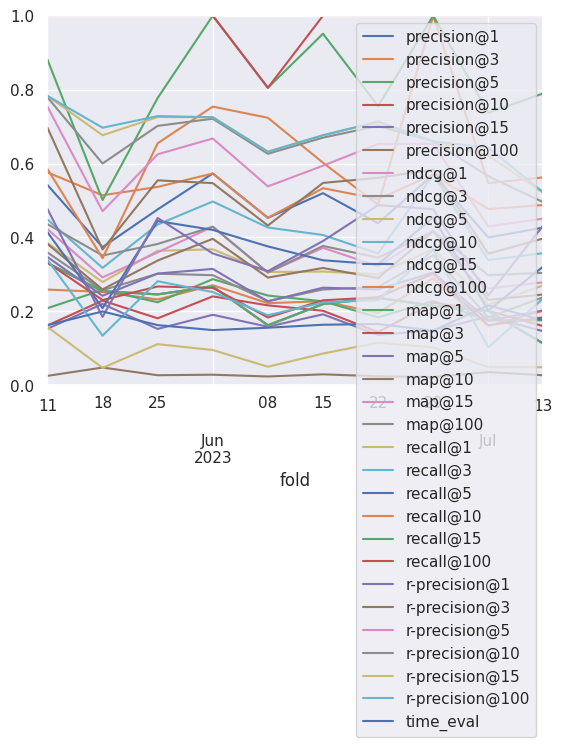

In [15]:
ax = bdf.plot()
ax.set_ylim(0, 1)

### Get perfect data

In [16]:
pdf = paths.load_perfect(ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE)
pdf = pdf[pdf.index <= CUTOFF_DATE][-LAST_FOLDS:]
pdf.mean()

precision@1        1.000000
precision@3        0.648433
precision@5        0.478408
precision@10       0.281155
precision@15       0.196069
precision@100      0.029725
ndcg@1             1.000000
ndcg@3             1.000000
ndcg@5             1.000000
ndcg@10            1.000000
ndcg@15            1.000000
ndcg@100           1.000000
map@1              1.000000
map@3              1.000000
map@5              1.000000
map@10             1.000000
map@15             1.000000
map@100            1.000000
recall@1           0.610202
recall@3           0.874680
recall@5           0.947672
recall@10          0.989542
recall@15          0.998317
recall@100         1.000000
r-precision@1      0.610202
r-precision@3      0.874680
r-precision@5      0.947672
r-precision@10     0.989542
r-precision@15     0.998317
r-precision@100    1.000000
time_eval          0.162138
dtype: float64

In [17]:
pdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-11,1.0,0.628297,0.443165,0.252518,0.169784,0.025468,1.0,1.0,1.0,1.0,...,0.998340,1.000000,1.0,0.620914,0.909505,0.963084,0.998340,1.000000,1.0,0.158323
2023-05-18,1.0,0.715976,0.595266,0.411834,0.309270,0.047988,1.0,1.0,1.0,1.0,...,0.957778,0.991590,1.0,0.508972,0.745850,0.856496,0.957778,0.991590,1.0,0.190576
2023-05-25,1.0,0.601093,0.431148,0.258197,0.180328,0.027213,1.0,1.0,1.0,1.0,...,0.990280,0.999036,1.0,0.666957,0.894313,0.947488,0.990280,0.999036,1.0,0.156202
2023-06-01,1.0,0.709571,0.522772,0.284158,0.190759,0.028614,1.0,1.0,1.0,1.0,...,0.998200,1.000000,1.0,0.557411,0.880153,0.974347,0.998200,1.000000,1.0,0.151228
2023-06-08,1.0,0.672316,0.496610,0.285593,0.192655,0.028898,1.0,1.0,1.0,1.0,...,0.997175,1.000000,1.0,0.582153,0.873577,0.953844,0.997175,1.000000,1.0,0.154855
2023-06-15,1.0,0.679293,0.506061,0.292424,0.197475,0.029621,1.0,1.0,1.0,1.0,...,0.996786,1.000000,1.0,0.580649,0.866947,0.950594,0.996786,1.000000,1.0,0.157040
2023-06-22,1.0,0.590090,0.421622,0.236486,0.161712,0.024324,1.0,1.0,1.0,1.0,...,0.995293,0.999578,1.0,0.681584,0.909616,0.967603,0.995293,0.999578,1.0,0.156821
2023-06-29,1.0,0.623053,0.439252,0.223364,0.148910,0.022336,1.0,1.0,1.0,1.0,...,1.000000,1.000000,1.0,0.651335,0.921295,0.994215,1.000000,1.000000,1.0,0.145961
2023-07-06,1.0,0.642570,0.491566,0.314859,0.229987,0.035743,1.0,1.0,1.0,1.0,...,0.974473,0.993410,1.0,0.607534,0.836657,0.911162,0.974473,0.993410,1.0,0.190696


(0.0, 1.0)

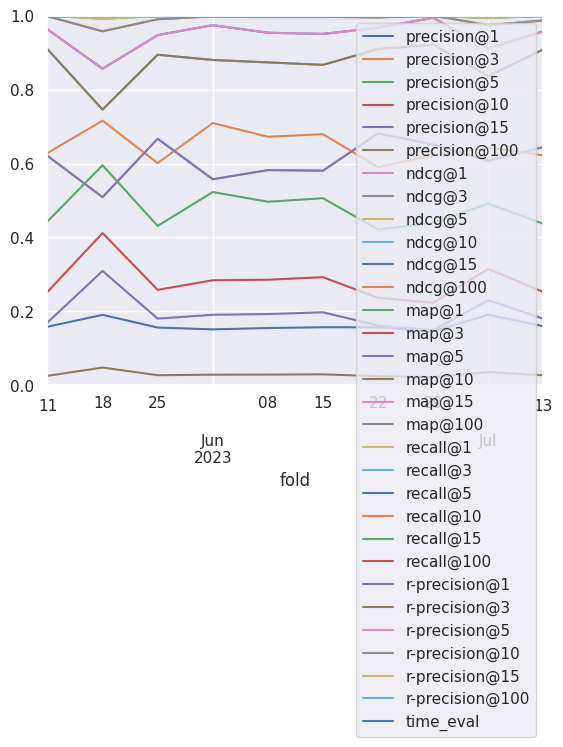

In [18]:
ax = pdf.plot()
ax.set_ylim(0, 1)

## Explore hparams

In [19]:
# Primero, obtenemos la mejor iteración, como si hubiesemos hecho early stopping
hdf = pd.concat(rg.get_dataframe(OPTIM_METRIC, OPTIM_MODE) for rg in result_grids)
print(hdf.columns)
hdf

Index(['real_batch_size', 'iteration', 'loss', 'mf_loss', 'emb_loss',
       'model_recall', 'model_ndcg', 'model_precision', 'model_map',
       'precision@1', 'precision@3', 'precision@5', 'precision@10',
       'precision@15', 'precision@100', 'ndcg@1', 'ndcg@3', 'ndcg@5',
       'ndcg@10', 'ndcg@15', 'ndcg@100', 'map@1', 'map@3', 'map@5', 'map@10',
       'map@15', 'map@100', 'recall@1', 'recall@3', 'recall@5', 'recall@10',
       'recall@15', 'recall@100', 'r-precision@1', 'r-precision@3',
       'r-precision@5', 'r-precision@10', 'r-precision@15', 'r-precision@100',
       'time_eval', 'time_train', 'time_rec', 'time_total_train',
       'time_total_test', 'done', 'training_iteration', 'trial_id', 'date',
       'timestamp', 'time_this_iter_s', 'time_total_s', 'pid', 'hostname',
       'node_ip', 'time_since_restore', 'iterations_since_restore',
       'config/batch_size', 'config/embedding_dim', 'config/conv_layers',
       'config/learning_rate', 'config/l2', 'config/window_siz

,real_batch_size,iteration,loss,mf_loss,emb_loss,model_recall,model_ndcg,model_precision,model_map,precision@1,...,time_since_restore,iterations_since_restore,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold,logdir
0,256,200,0.211465,0.209650,0.001815,0.032194,0.071942,0.071942,0.071942,0.374101,...,74.386001,40,8,15,3,0.0002,0.000128,30d,2023-05-11T00:00:00,042e4fdf
1,819,195,0.557726,0.556632,0.001093,0.022482,0.050360,0.050360,0.050360,0.323741,...,32.309691,39,10,15,3,0.0001,0.000590,30d,2023-05-11T00:00:00,f801aa5f
2,512,180,0.626910,0.625930,0.000980,0.059532,0.122302,0.122302,0.122302,0.388489,...,42.838615,36,9,3,2,0.0001,0.001585,30d,2023-05-11T00:00:00,4c7a389b
3,1024,15,0.692839,0.692209,0.000630,0.013429,0.028777,0.028777,0.028777,0.381295,...,3.659595,3,10,6,2,0.0001,0.007904,60d,2023-05-11T00:00:00,0b15d6c6
4,64,10,0.205495,0.205247,0.000249,0.066007,0.129496,0.129496,0.129496,0.410072,...,7.126327,2,6,4,1,0.0030,0.000023,30d,2023-05-11T00:00:00,b5314fe3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,128,30,0.044412,0.017142,0.027270,0.005471,0.021127,0.021127,0.021127,0.288732,...,356.237063,6,7,381,3,0.0018,0.001087,10YE,2023-07-13T00:00:00,4d13cd81
96,512,5,0.039766,0.038984,0.000782,0.019654,0.042254,0.042254,0.042254,0.345070,...,11.441302,1,9,16,4,0.0303,0.000014,10YE,2023-07-13T00:00:00,8f830aa5
97,128,200,0.115770,0.053031,0.062740,0.073905,0.133803,0.133803,0.133803,0.239437,...,139.764271,40,7,21,3,0.0016,0.006050,30d,2023-07-13T00:00:00,ecc233f8
98,512,110,0.030141,0.021090,0.009051,0.079343,0.112676,0.112676,0.112676,0.288732,...,24.533024,22,9,447,3,0.0008,0.000129,60d,2023-07-13T00:00:00,1b0d65d6


In [20]:
# Force categorization
hdf['config/fold'] = hdf['config/fold'].astype(str)

fig = px.scatter(hdf, x='map@10', y='ndcg@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [21]:
fig = px.scatter(hdf, x='iteration', y='loss', color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [22]:
fig = px.scatter(hdf, x='iteration', y=OPTIM_METRIC, color='config/fold', log_y=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [23]:
fig = px.scatter(hdf, x='loss', y='ndcg@10', color='config/fold', log_x=True)
fig.layout.update(showlegend=True)

download_plotly(fig, 'scatter_ndcg_map.pdf')
fig

In [24]:
fig = px.scatter(hdf, x='real_batch_size', y='config/window_size', color='config/fold')
fig

In [25]:
fig = px.scatter(hdf, x=OPTIM_METRIC, y='precision@10', color='config/fold')
fig.layout.update(showlegend=False)

download_plotly(fig, 'scatter_map_precision.pdf')
fig

In [26]:
def plotly_scatter_config(config, log=True):
    config_cols = [c for c in hdf.columns if c.startswith('config/') ]
    return px.scatter(hdf, x=config, y=OPTIM_METRIC, color='config/fold', marginal_x='rug', marginal_y='rug', log_x=log, hover_data=config_cols)

plotly_scatter_config('config/embedding_dim')

In [27]:
plotly_scatter_config('config/window_size', log=False)

In [28]:
plotly_scatter_config('config/learning_rate')

In [29]:
plotly_scatter_config('config/l2')

In [30]:
plotly_scatter_config('config/batch_size', log=False)

In [31]:
plotly_scatter_config('config/conv_layers')

In [32]:
def clean_results(df: pd.DataFrame):
    hparams = [ c.removeprefix('config/') for c in df.columns if c.startswith('config/') and c not in ['config/iteration', 'config/fold'] ]
    return (
        df
        .rename(columns=lambda c: c.removeprefix('config/'),)
        .rename(columns={
            'time_total_train': 'time_train',
            'time_total_test': 'time_eval',
            'time_total_rec': 'time_rec',
        })
        .drop(columns=['real_batch_size'])
        .set_index(['fold', *hparams])
    ), hparams

clean_rdf, hparams = clean_results(rdf.copy())
clean_rdf

iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size              
2023-05-11 256        15            3           0.0002        0.000128 30d                  5   
                                                                       30d                 10   
                                                                       30d                 15   
                                                                       30d                 20   
                                                                       30d                 25   
...                                                                                       ...   
2023-07-13 1024       5             4           0.0008        0.000670 60d                180   
                                                                       60d                185   
                                                                       60d                190   
                                                                       60d                195   
                                                                       60d                200   

                                                                                        loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size             
2023-05-11 256        15            3           0.0002        0.000128 30d          0.690791   
                                                                       30d          0.686446   
                                                                       30d          0.677144   
                                                                       30d          0.661877   
                                                                       30d          0.640315   
...                                                                                      ...   
2023-07-13 1024       5             4           0.0008        0.000670 60d          0.279688   
                                                                       60d          0.277907   
                                                                       60d          0.266804   
                                                                       60d          0.268515   
                                                                       60d          0.269850   

                                                                                     mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size             
2023-05-11 256        15            3           0.0002        0.000128 30d          0.690743   
                                                                       30d          0.686387   
                                                                       30d          0.677066   
                                                                       30d          0.661772   
                                                                       30d          0.640177   
...                                                                                      ...   
2023-07-13 1024       5             4           0.0008        0.000670 60d          0.271108   
                                                                       60d          0.269103   
                                                                       60d          0.257770   
                                                                       60d          0.259252   
                                                                       60d          0.260389   

                                                                                    emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2       window_size             
2023-05-11 256        15            3           0.0002        0.000128 30d          0.000048   
                                    

In [33]:
px.scatter(clean_rdf.reset_index(), y='iteration', x='loss', color='fold', log_x=True)

In [34]:
px.scatter(clean_rdf.reset_index(), x='loss', y=OPTIM_METRIC, color='fold', log_x=True)

Letting it run more iterations gets a best loss. But letting it run more does not get a best ndcg or map, as loss and the test results have not a strong correlation.

In [35]:
px.scatter(clean_rdf.reset_index(), y='iteration', x=OPTIM_METRIC, color='fold')

## Choosing best hparams

In [36]:
best_all = clean_rdf.sort_values(OPTIM_METRIC).drop_duplicates('trial_id', keep='last')
paths.save_model_results(best_all, 'lightgcn-all', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best_all

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Decentraland/models/lightgcn-all_W-THU_normalize.parquet


iteration  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size              
2023-07-13 1024       5             4           0.0008        6.700374e-04 60d                200   
           128        1             3           0.0007        3.600071e-05 60d                 75   
2023-07-06 256        11            4           0.0001        1.082300e-04 10YE                25   
           1024       1             3           0.0194        1.589233e-06 10YE                50   
2023-07-13 1024       1             1           0.0029        6.990705e-04 21d                 55   
...                                                                                           ...   
2023-06-08 1024       1             2           0.0307        1.218068e-06 90d                 35   
2023-06-29 64         1             4           0.0292        3.519683e-07 90d                 70   
2023-06-08 1024       1             1           0.0162        4.693379e-03 90d                175   
                                                0.0110        3.212131e-03 90d                175   
           512        1             3           0.0156        3.636292e-05 90d                105   

                                                                                            loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2023-07-13 1024       5             4           0.0008        6.700374e-04 60d          0.269850   
           128        1             3           0.0007        3.600071e-05 60d          0.417503   
2023-07-06 256        11            4           0.0001        1.082300e-04 10YE         0.372413   
           1024       1             3           0.0194        1.589233e-06 10YE         0.262454   
2023-07-13 1024       1             1           0.0029        6.990705e-04 21d          0.474351   
...                                                                                          ...   
2023-06-08 1024       1             2           0.0307        1.218068e-06 90d          0.394726   
2023-06-29 64         1             4           0.0292        3.519683e-07 90d          0.356428   
2023-06-08 1024       1             1           0.0162        4.693379e-03 90d          0.433930   
                                                0.0110        3.212131e-03 90d          0.427330   
           512        1             3           0.0156        3.636292e-05 90d          0.387119   

                                                                                         mf_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2           window_size             
2023-07-13 1024       5             4           0.0008        6.700374e-04 60d          0.260389   
           128        1             3           0.0007        3.600071e-05 60d          0.417247   
2023-07-06 256        11            4           0.0001        1.082300e-04 10YE         0.371935   
           1024       1             3           0.0194        1.589233e-06 10YE         0.262419   
2023-07-13 1024       1             1           0.0029        6.990705e-04 21d          0.473168   
...                                                                                          ...   
2023-06-08 1024       1             2           0.0307        1.218068e-06 90d          0.394709   
2023-06-29 64         1             4           0.0292        3.519683e-07 90d          0.356403   
2023-06-08 1024       1             1           0.0162        4.693379e-03 90d          0.416304   
                                                0.0110        3.212131e-03 90d          0.412694   
           512        1             3           0.0156        3.636292e-05 90d          0.386120   

                                                                                        emb_loss  \
fold       batch_size embedding_dim conv_layers learning_rate l2        

### Per fold

In [37]:
# We fix the total time in less than 250 so it has time to do the same number of iterations with the next fold
# best = rdf[rdf['time_total_train'] + rdf['time_total_test'] < 250].sort_values(OPTIM_METRIC).drop_duplicates('config/fold', keep='last').set_index('config/fold').sort_index()
idx = clean_rdf.index.names + ['iteration']
best = clean_rdf.sort_values(OPTIM_METRIC).reset_index().drop_duplicates('fold', keep='last').set_index(idx).sort_index()
paths.save_model_results(best, 'lightgcn-best-val', ORG_NAME, SPLITS_FREQ, SPLITS_NORMALIZE, K_RECOMMENDATIONS)
best

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Decentraland/models/lightgcn-best-val_W-THU_normalize.parquet


,,,,,,,,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,...,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_rec,time_train,time_eval,done,trial_id
fold,batch_size,embedding_dim,conv_layers,learning_rate,l2,window_size,iteration,,,,,,,,,,,,,,,,,,,,,
2023-05-11,1024,3,1,0.0724,9.653657e-05,10YE,110,0.106586,0.102833,0.003754,0.438849,0.345324,0.279137,0.197122,0.158273,0.025468,0.438849,...,0.730189,0.769239,0.805479,0.807451,0.807451,0.197437,88.550736,5.707815,False,5c631790
2023-05-18,1024,1,2,0.0138,1.458908e-05,90d,5,0.489157,0.489116,0.000041,0.372781,0.355030,0.328994,0.291124,0.250099,0.047988,0.372781,...,0.436336,0.519639,0.630379,0.675647,0.689200,0.049735,0.822725,0.459906,False,8b935bdd
2023-05-25,512,3,2,0.0001,1.585058e-03,30d,30,0.691933,0.691794,0.000139,0.467213,0.344262,0.277049,0.200000,0.163934,0.027213,0.467213,...,0.657158,0.717568,0.772219,0.786585,0.788290,0.007778,3.706138,1.479065,False,ba3b2a39
2023-06-01,256,162,2,0.0681,9.065220e-06,21d,120,0.013103,0.001318,0.011785,0.455446,0.412541,0.382178,0.270297,0.190759,0.028614,0.455446,...,0.628409,0.727175,0.762952,0.765885,0.765885,0.006727,15.683816,5.405169,False,e3d95580
2023-06-08,512,1,3,0.0156,3.636292e-05,90d,105,0.387119,0.386120,0.000998,0.593220,0.437853,0.345763,0.266102,0.192655,0.028898,0.593220,...,0.692762,0.743429,0.800270,0.803603,0.803603,0.005751,17.357783,6.125229,False,d29a0404
2023-06-15,64,14,2,0.0023,5.547063e-06,10YE,5,0.078822,0.078733,0.000089,0.424242,0.340909,0.295455,0.220455,0.191919,0.029621,0.424242,...,0.548938,0.621632,0.665785,0.671596,0.671596,0.306605,40.716495,0.272192,False,21688462
2023-06-22,64,1,3,0.0360,1.011096e-03,90d,120,0.390462,0.378618,0.011844,0.533784,0.322072,0.270270,0.183108,0.154054,0.024324,0.533784,...,0.635866,0.682837,0.714449,0.720693,0.721412,0.012004,261.327949,7.320309,False,d9a0dd58
2023-06-29,64,1,4,0.0292,3.519683e-07,90d,70,0.356428,0.356403,0.000026,0.532710,0.380062,0.287850,0.223364,0.148910,0.022336,0.532710,...,0.724665,0.771209,0.775971,0.775971,0.775971,0.011324,182.582120,4.053005,False,66374548
2023-07-06,256,24,4,0.0030,5.893737e-05,10YE,35,0.029209,0.025992,0.003217,0.317269,0.305221,0.267470,0.230924,0.200268,0.035743,0.317269,...,0.467257,0.523550,0.600542,0.627977,0.639666,0.032057,332.593788,1.843407,True,8434e462


,precision@5,map@10
count,10.000000,10.000000
mean,0.294966,0.492843
std,0.046724,0.087690
min,0.215493,0.366353
25%,0.271965,0.418087
50%,0.283494,0.506245
75%,0.320609,0.560978
max,0.382178,0.611039


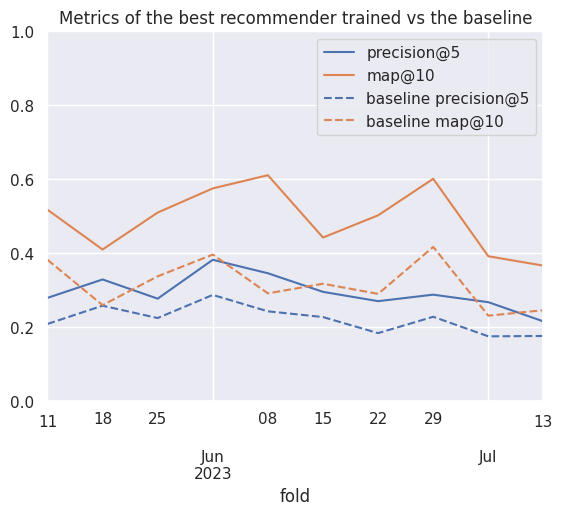

In [38]:
cols2plot = ['precision@5', 'map@10']

ax = best.reset_index().set_index('fold')[cols2plot].plot()
ax.set_ylim(0, 1)

bdf[cols2plot].rename(columns='baseline {}'.format).plot(ax=ax, style='--', color=[l.get_color() for l in ax.lines])

plt.title("Metrics of the best recommender trained vs the baseline")
best[cols2plot].describe()

In [39]:
best[['precision@5', 'ndcg@5', 'precision@10', 'ndcg@10', 'map@5', 'map@10']].mean()

precision@5     0.294966
ndcg@5          0.509611
precision@10    0.226067
ndcg@10         0.591321
map@5           0.445389
map@10          0.492843
dtype: float64

## Realisitc model (repeating hparams)

In [40]:
from pandas.api.types import is_float_dtype

config_cols = [ c for c in rdf.columns if c.startswith('config/') and c != 'config/iteration' ]
config_cols2 = config_cols + ['config/iteration']

all_configs = rdf.copy()
display(all_configs)
all_configs['config/fold'] = (pd.to_datetime(all_configs['config/fold']) + pd.tseries.frequencies.to_offset(SPLITS_FREQ)) # .astype(str)

# Leonardo Torres de Quevedo, perdoname por lo que voy a hacer
float_cols = [c for c in config_cols if is_float_dtype(all_configs[c].dtype) ]
all_configs[float_cols] = all_configs[float_cols].astype(str)
all_configs = all_configs.set_index(config_cols)
all_configs_index = all_configs.index

# all_configs_index = pd.MultiIndex.from_frame(all_configs[config_cols].astype(str))[:-1]

# No podemos utilizar los indices "tal cual" pues la coma flotante
# no encaja entre un fold y otro. Así que lo convierto a string
# y luego de nuevo a coma flotante.
# La otra solución sería usar np.isclose, pero habría que programar
# varias lineas y hacer nuestra propia función de búsqueda por cada
# columna o algo así
# O también, en lugar de str, multiplicar por 10^7 (el min. es 10**-7),
# pasar a entero, y luego dividir
aux = rdf.copy()
aux[float_cols] = aux[float_cols].astype(str)
aux = aux.set_index(config_cols)
print("Index intersection:", aux.index.intersection(all_configs_index))
all_realistic = aux.loc[aux.index.intersection(all_configs_index)]
# all_realistic.index = all_realistic.index.set_levels(
#     [ pd.to_numeric(l) for l in realistic.index.levels ]
# )
all_realistic

,real_batch_size,config/iteration,loss,mf_loss,emb_loss,precision@1,precision@3,precision@5,precision@10,precision@15,...,time_total_test,done,trial_id,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,config/fold
0,256,5,0.690791,0.690743,0.000048,0.359712,0.280576,0.235971,0.191367,0.157794,...,0.391446,False,042e4fdf,256,15,3,0.0002,0.000128,30d,2023-05-11
1,256,10,0.686446,0.686387,0.000060,0.294964,0.280576,0.233094,0.193525,0.159233,...,0.703534,False,042e4fdf,256,15,3,0.0002,0.000128,30d,2023-05-11
2,256,15,0.677144,0.677066,0.000078,0.323741,0.282974,0.234532,0.192806,0.159233,...,0.918318,False,042e4fdf,256,15,3,0.0002,0.000128,30d,2023-05-11
3,256,20,0.661877,0.661772,0.000104,0.309353,0.282974,0.235971,0.189928,0.159712,...,1.123469,False,042e4fdf,256,15,3,0.0002,0.000128,30d,2023-05-11
4,256,25,0.640315,0.640177,0.000137,0.302158,0.290168,0.243165,0.184173,0.159233,...,1.327383,False,042e4fdf,256,15,3,0.0002,0.000128,30d,2023-05-11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35,1024,180,0.279688,0.271108,0.008580,0.126761,0.129108,0.153521,0.158451,0.145540,...,10.026958,False,27fe706f,1024,5,4,0.0008,0.000670,60d,2023-07-13
36,1024,185,0.277907,0.269103,0.008804,0.126761,0.129108,0.154930,0.157746,0.145540,...,10.247056,False,27fe706f,1024,5,4,0.0008,0.000670,60d,2023-07-13
37,1024,190,0.266804,0.257770,0.009035,0.133803,0.131455,0.156338,0.157042,0.146009,...,10.626235,False,27fe706f,1024,5,4,0.0008,0.000670,60d,2023-07-13
38,1024,195,0.268515,0.259252,0.009264,0.133803,0.133803,0.160563,0.156338,0.145540,...,10.831014,False,27fe706f,1024,5,4,0.0008,0.000670,60d,2023-07-13


Index intersection: MultiIndex([( 256,  96, 2,                '0.0784', ...),
            ( 256, 219, 4,                 '0.095', ...),
            ( 512,   3, 2,                '0.0001', ...),
            ( 128,  74, 2,                '0.1736', ...),
            ( 512,  86, 3,                '0.0002', ...),
            ( 128,  34, 2,                '0.0091', ...),
            ( 512,  26, 2,                '0.6694', ...),
            ( 256, 241, 2, '0.0017000000000000001', ...),
            ( 512, 447, 3,                '0.0008', ...),
            ( 256,  32, 4,  '0.015000000000000001', ...),
            ...
            ( 128,  74, 2,                '0.1736', ...),
            ( 256, 219, 4,                 '0.095', ...),
            ( 256,  27, 2,                '0.2056', ...),
            (  64, 217, 2,   '0.47850000000000004', ...),
            ( 512,   7, 4,                '0.1593', ...),
            ( 512,   3, 2,                '0.0001', ...),
            (1024, 332, 3,          

real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                    
256               96                   2                  0.0784               4.9242449710696274e-05 21d                2023-05-18               256   
                                                                                                                         2023-05-18               256   
                                                                                                                         2023-05-18               256   
                                                                                                                         2023-05-18               256   
                                                                                                                         2023-05-18               256   
...                                                                                                                                               ...   
512               447                  3                  0.0008               0.00012930138476387965 60d                2023-07-13               512   
                                                                                                                         2023-07-13               512   
                                                                                                                         2023-07-13               512   
                                                                                                                         2023-07-13               512   
                                                                                                                         2023-07-13               512   

                                                                                                                                      config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2              config/window_size config/fold                     
256               96                   2                  0.0784               4.9242449710696274e-05 21d                2023-05-18                  5   
                                                                                                                         2023-05-18                 10   
                                                                                                                         2023-05-18                 15   
                                                                                                                         2023-05-18                 20   
                                                                                                                         2023-05-18                 25   
...                                                                                                                                                ...   
512               447                  3                  0.0008               0.00012930138476387965 60d                2023-07-13                180   
                                                                                                                         2023-07-13                185   
                                                                                                                         2023-07-13                190   
                                                                                                                         2023-07-13                195   
                                                                                                                         2023-07-13                200   

                                                                                                                                          los

In [41]:
def bestByFold(df):
    idx = df[OPTIM_METRIC].idxmax()
    return df.loc[idx]

best_configs = (
    all_configs.loc[all_configs.index.intersection(all_realistic.index)]
    .reset_index()
    .groupby("config/fold")
    .apply(bestByFold)
    .set_index(config_cols)
    # .rename(columns="best_{}".format)
)
best_configs

/tmp/ipykernel_3795145/543710717.py:9: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



real_batch_size  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2             config/window_size config/fold                    
512               3                    2                  0.0001               0.0015850583576508905 30d                2023-05-18               512   
1024              1                    1                  0.026000000000000002 4.260854469454438e-05 90d                2023-05-25              1024   
512               3                    2                  0.0001               0.0015850583576508905 30d                2023-06-01               512   
1024              1                    4                  0.005200000000000001 4.272373838493727e-05 90d                2023-06-08              1024   
                                       1                  0.0162               0.004693379188375914  90d                2023-06-15              1024   
                  332                  3                  0.4863               0.0022115851672258576 10YE               2023-06-22              1024   
256               1                    4                  0.1206               0.0019417121452336183 90d                2023-06-29               256   
                  32                   4                  0.015000000000000001 1.242023640083893e-06 10YE               2023-07-06               256   
                  24                   4                  0.003                5.893737215566602e-05 10YE               2023-07-13               256   

                                                                                                                                     config/iteration  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2             config/window_size config/fold                     
512               3                    2                  0.0001               0.0015850583576508905 30d                2023-05-18                180   
1024              1                    1                  0.026000000000000002 4.260854469454438e-05 90d                2023-05-25                175   
512               3                    2                  0.0001               0.0015850583576508905 30d                2023-06-01                 30   
1024              1                    4                  0.005200000000000001 4.272373838493727e-05 90d                2023-06-08                200   
                                       1                  0.0162               0.004693379188375914  90d                2023-06-15                175   
                  332                  3                  0.4863               0.0022115851672258576 10YE               2023-06-22                180   
256               1                    4                  0.1206               0.0019417121452336183 90d                2023-06-29                 45   
                  32                   4                  0.015000000000000001 1.242023640083893e-06 10YE               2023-07-06                 20   
                  24                   4                  0.003                5.893737215566602e-05 10YE               2023-07-13                 35   

                                                                                                                                         loss  \
config/batch_size config/embedding_dim config/conv_layers config/learning_rate config/l2             config/window_size config/fold             
512               3                    2                  0.0001               0.0015850583576508905 30d                2023-05-18   0.626910   
1024              1                    1                  0.026000000000000002 4.260854469454438e-05 90d                2023-05-25   0.355422   
512               3                    2                  0.0001               0.0015850583576508905 30d                2023-06-01   0.691933   
1024              1                    4           

In [42]:
best_realistic = all_realistic.join(best_configs.rename(columns="best_{}".format), how='right')

# Display the configs, to see that nothing is missing
display(best_realistic.groupby(best_realistic.index).size())

# First, do the "early stopping" (keep only the ones that are the same iterations or less)
best_realistic = best_realistic[best_realistic['config/iteration'] <= best_realistic['best_config/iteration']]
# Now, lets keep just the one with the best iteration
best_realistic = (
    best_realistic.sort_values('config/iteration')
    .groupby('config/fold')
    .tail(1)
    .sort_index()
    .reset_index()
    .set_index('config/fold')
    .sort_index()
)
best_realistic

(256, 1, 4, 0.1206, 0.0019417121452336183, 90d, 2023-06-29 00:00:00)                    40
(256, 24, 4, 0.003, 5.893737215566602e-05, 10YE, 2023-07-13 00:00:00)                   18
(256, 32, 4, 0.015000000000000001, 1.242023640083893e-06, 10YE, 2023-07-06 00:00:00)    19
(512, 3, 2, 0.0001, 0.0015850583576508905, 30d, 2023-05-18 00:00:00)                    80
(512, 3, 2, 0.0001, 0.0015850583576508905, 30d, 2023-06-01 00:00:00)                    40
(1024, 1, 1, 0.0162, 0.004693379188375914, 90d, 2023-06-15 00:00:00)                    40
(1024, 1, 1, 0.026000000000000002, 4.260854469454438e-05, 90d, 2023-05-25 00:00:00)     40
(1024, 1, 4, 0.005200000000000001, 4.272373838493727e-05, 90d, 2023-06-08 00:00:00)     40
(1024, 332, 3, 0.4863, 0.0022115851672258576, 10YE, 2023-06-22 00:00:00)                40
dtype: int64

,config/batch_size,config/embedding_dim,config/conv_layers,config/learning_rate,config/l2,config/window_size,real_batch_size,config/iteration,loss,mf_loss,...,best_r-precision@3,best_r-precision@5,best_r-precision@10,best_r-precision@15,best_r-precision@100,best_time_rec,best_time_total_train,best_time_total_test,best_done,best_trial_id
config/fold,,,,,,,,,,,,,,,,,,,,,
2023-05-18,512,3,2,0.0001,0.0015850583576508905,30d,512,180,0.657799,0.657202,...,0.724746,0.747858,0.788791,0.790789,0.790789,0.007917,31.668030,9.643726,False,4c7a389b
2023-05-25,1024,1,1,0.026000000000000002,4.260854469454438e-05,90d,1024,175,0.381929,0.380894,...,0.428860,0.544268,0.662834,0.713843,0.727645,0.008823,18.928798,10.211266,False,1a948aa4
2023-06-01,512,3,2,0.0001,0.0015850583576508905,30d,512,30,0.692045,0.691885,...,0.657158,0.717568,0.772219,0.786585,0.788290,0.007778,3.706138,1.479065,False,ba3b2a39
2023-06-08,1024,1,4,0.005200000000000001,4.272373838493727e-05,90d,1024,200,0.382319,0.381407,...,0.607029,0.736488,0.771759,0.774739,0.774739,0.009594,42.750376,11.250058,True,f9e5b5fd
2023-06-15,1024,1,1,0.0162,0.004693379188375914,90d,1024,175,0.392007,0.375995,...,0.677542,0.739961,0.791152,0.795656,0.795656,0.175292,40.546913,8.919723,False,b69c9679
2023-06-22,1024,332,3,0.4863,0.0022115851672258576,10YE,1024,180,7.550814,0.737933,...,0.559133,0.614639,0.667921,0.672656,0.672656,0.207817,220.424895,9.075739,False,283fb692
2023-06-29,256,1,4,0.1206,0.0019417121452336183,90d,256,45,0.410550,0.387467,...,0.637431,0.705732,0.742625,0.750266,0.751019,0.009336,28.548237,2.790653,False,f503f70c
2023-07-06,256,32,4,0.015000000000000001,1.242023640083893e-06,10YE,256,20,0.013932,0.013773,...,0.653660,0.728038,0.737278,0.737278,0.737278,0.183149,26.910744,0.847663,False,9a617f00
2023-07-13,256,24,4,0.003,5.893737215566602e-05,10YE,256,35,0.028480,0.025303,...,0.467257,0.523550,0.600542,0.627977,0.639666,0.032057,332.593788,1.843407,True,8434e462


In [43]:
paths.save_model_results(
    clean_results(best_realistic.reset_index().copy())[0],
    'lightgcn-best-test',
    ORG_NAME,
    SPLITS_FREQ,
    SPLITS_NORMALIZE,
    K_RECOMMENDATIONS,
)

Saved dataframe into /home/daviddavo/recsys4daos/data/output/Decentraland/models/lightgcn-best-test_W-THU_normalize.parquet


,precision@5,map@10
count,9.000000,9.000000
mean,0.275080,0.413346
std,0.048055,0.086724
min,0.207042,0.306735
25%,0.260656,0.340873
50%,0.266667,0.405514
75%,0.312150,0.463475
max,0.346535,0.563800


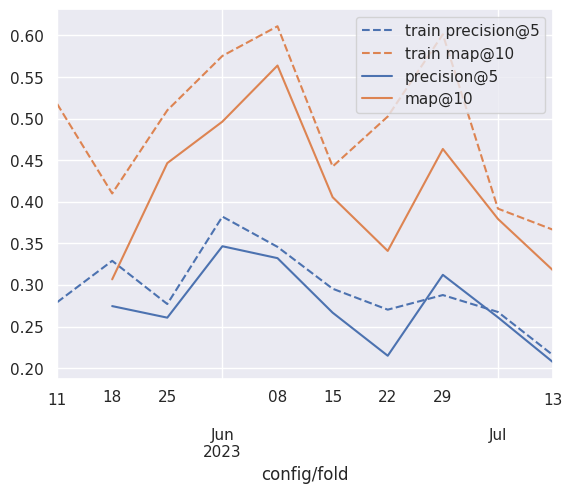

In [44]:
_toplot = best_realistic.copy().sort_index()
_toplot.index = pd.to_datetime(_toplot.index)

ax = best.reset_index().set_index('fold')[cols2plot].rename(columns='train {}'.format).plot(style='--', color=[l.get_color() for l in ax.lines])
# plt.xticks(range(10))
# bdf[cols2plot].rename(columns='baseline {}'.format).reset_index(drop=True).plot(ax=ax, style=':', color=[l.get_color() for l in ax.lines])

_toplot[cols2plot].plot(ax=ax)
# ax.set_ylim(0, 1)

_toplot[cols2plot].describe()

In [45]:
best_realistic.index.min()

Timestamp('2023-05-18 00:00:00')

In [46]:
bdf

,precision@1,precision@3,precision@5,precision@10,precision@15,precision@100,ndcg@1,ndcg@3,ndcg@5,ndcg@10,...,recall@10,recall@15,recall@100,r-precision@1,r-precision@3,r-precision@5,r-precision@10,r-precision@15,r-precision@100,time_eval
fold,,,,,,,,,,,,,,,,,,,,,
2023-05-11,0.330935,0.258993,0.208633,0.161871,0.152998,0.025468,0.330935,0.359388,0.384974,0.448542,...,0.585271,0.881293,1.000000,0.477095,0.697095,0.753868,0.779211,0.783058,0.783058,0.162671
2023-05-18,0.254438,0.252465,0.257988,0.228994,0.220118,0.047988,0.254438,0.257149,0.279337,0.317611,...,0.343667,0.501146,1.000000,0.185033,0.367456,0.470881,0.600027,0.676580,0.696883,0.199754
2023-05-25,0.245902,0.232240,0.224590,0.181148,0.152459,0.027213,0.245902,0.301945,0.363931,0.434913,...,0.654777,0.777379,1.000000,0.452754,0.554461,0.625043,0.701911,0.725648,0.728262,0.162754
2023-06-01,0.267327,0.270627,0.287129,0.240594,0.190759,0.028614,0.267327,0.297822,0.367923,0.497208,...,0.753990,1.000000,1.000000,0.356734,0.546934,0.667643,0.721178,0.725219,0.725219,0.149312
2023-06-08,0.162393,0.222222,0.242735,0.216239,0.158405,0.023761,0.161017,0.227753,0.306508,0.426848,...,0.723698,0.804894,0.804894,0.308835,0.432256,0.538069,0.626323,0.631878,0.631878,0.155732
2023-06-15,0.219697,0.227273,0.227273,0.201515,0.191919,0.029621,0.219697,0.259208,0.307695,0.406611,...,0.602116,0.951136,1.000000,0.390312,0.547467,0.594050,0.670034,0.676466,0.676466,0.163770
2023-06-22,0.236486,0.195946,0.183784,0.143919,0.136036,0.024324,0.236486,0.265955,0.300084,0.356482,...,0.488397,0.755448,1.000000,0.487443,0.561280,0.652888,0.701683,0.712130,0.713332,0.165822
2023-06-29,0.214953,0.289720,0.228037,0.223364,0.148910,0.022336,0.214953,0.352264,0.368931,0.569957,...,1.000000,1.000000,1.000000,0.476501,0.583598,0.653157,0.659886,0.659886,0.659886,0.147881
2023-07-06,0.200803,0.160643,0.175100,0.201205,0.185810,0.035743,0.200803,0.183294,0.217796,0.338701,...,0.546963,0.737231,1.000000,0.243064,0.355994,0.429516,0.565517,0.621029,0.642700,0.216293


In [47]:
_PERFECT_NAME = 'Ground Truth'
_LEAK_NAME = 'Leaky GNN'
CAT_ORDER = [_PERFECT_NAME, _LEAK_NAME, 'GNN', 'OpenPop']

def _get_toplot_table(metrics2plot=cols2plot, oracle=True, perfect=None, common_only=False):
    if perfect is None:
        perfect = metrics2plot
    
    # _toplot = best_realistic.copy()
    # _toplot.index = pd.to_numeric(_toplot.index)
    # _toplot['fold'] = _toplot.index

    _first_real_fold_idx = best_realistic.index.min()
    
    _toplot_real = best_realistic[metrics2plot].copy()
    _toplot_real['fold'] = pd.to_datetime(_toplot_real.index) # .astype(int)
    _toplot_real['rec'] = 'GNN'

    _toplot_base = bdf[metrics2plot].copy()
    # fold2str = _toplot_base.index.strftime('%G-W%V')
    # _toplot_base['fold'] = range(len(_toplot_base))
    _toplot_base['fold'] = pd.to_datetime(_toplot_base.index)
    _toplot_base['rec'] = 'OpenPop'

    # _colsbest = map("best_{}".format, _cols)
    if oracle:
        _toplot_best = best.reset_index().set_index('fold')[metrics2plot].copy() # [_colsbest].rename(columns=lambda x: x.split("_", 1)[-1])
        _toplot_best['fold'] = _toplot_best.index
        _toplot_best['rec'] = _LEAK_NAME
    else:
        _toplot_best = None
        _toplot_base = _toplot_base[_toplot_base['fold'] >= _first_real_fold_idx]
        _toplot_real = _toplot_real[_toplot_real['fold'] >= _first_real_fold_idx]

    if perfect:
        _toplot_perfect = pdf[perfect].copy()
        _toplot_perfect['fold'] = pd.to_datetime(_toplot_perfect.index)
        _toplot_perfect['rec'] = _PERFECT_NAME
        # Make same len as baseline
        # _toplot_perfect = _toplot_perfect.iloc[-len(_toplot_base):]
        _toplot_perfect = _toplot_perfect.loc[_toplot_base.index]
        assert _toplot_perfect.index.equals(_toplot_base.index)
    else:
        _toplot_perfect = None
        
    _toplot = (
        pd.concat((
            _toplot_real, 
            _toplot_best,
            _toplot_base,
            _toplot_perfect,
        ), ignore_index=True)
        .melt(id_vars=['fold', 'rec'], value_vars=metrics2plot, var_name='metric')
    )

    assert pd.api.types.is_datetime64_any_dtype(_toplot['fold'].dtype), "Fold column should be datetime"
    assert not (_toplot['fold'].isna()).any()
    
    _toplot['rec'] = pd.Categorical(_toplot['rec'], CAT_ORDER)
    _toplot['fold_week'] = _toplot['fold'].dt.strftime('%G-W%V') # fold2str[_toplot['fold']]

    return _toplot.sort_values('fold')

_tablecols = ['precision@5', 'precision@10', 'recall@5', 'recall@10', 'map@5', 'map@10', 'ndcg@5', 'ndcg@10']
_table = _get_toplot_table(_tablecols)
# Skip the first fold so everyone has 9 folds and metrics are consistent
_table = _table[_table['fold'] >= best_realistic.index.min()]
print(_table.groupby(['rec', 'metric'])['value'].mean().unstack(level=-1)[_tablecols].rename(
    index={
        'Perfect': 'Ground Truth',
        'realistic': 'GNN'
    }
).style.format(precision=2).to_latex())
_table.groupby(['rec', 'metric']).describe()

\begin{tabular}{lrrrrrrrr}
metric & precision@5 & precision@10 & recall@5 & recall@10 & map@5 & map@10 & ndcg@5 & ndcg@10 \\
rec &  &  &  &  &  &  &  &  \\
Ground Truth & 0.48 & 0.28 & 0.95 & 0.99 & 1.00 & 1.00 & 1.00 & 1.00 \\
Leaky GNN & 0.30 & 0.23 & 0.54 & 0.78 & 0.44 & 0.49 & 0.51 & 0.59 \\
GNN & 0.28 & 0.22 & 0.47 & 0.74 & 0.36 & 0.41 & 0.43 & 0.52 \\
OpenPop & 0.22 & 0.20 & 0.34 & 0.63 & 0.25 & 0.31 & 0.31 & 0.41 \\
\end{tabular}



/tmp/ipykernel_3795145/3868849439.py:68: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.

/tmp/ipykernel_3795145/3868849439.py:74: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



fold                                            \
                          count                 mean                  min   
rec          metric                                                         
Ground Truth map@10           9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             map@5            9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             ndcg@10          9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             ndcg@5           9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             precision@10     9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             precision@5      9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             recall@10        9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             recall@5         9  2023-06-15 00:00:00  2023-05-18 00:00:00   
Leaky GNN    map@10           9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             map@5            9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             ndcg@10          9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             ndcg@5           9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             precision@10     9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             precision@5      9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             recall@10        9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             recall@5         9  2023-06-15 00:00:00  2023-05-18 00:00:00   
GNN          map@10           9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             map@5            9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             ndcg@10          9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             ndcg@5           9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             precision@10     9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             precision@5      9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             recall@10        9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             recall@5         9  2023-06-15 00:00:00  2023-05-18 00:00:00   
OpenPop      map@10           9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             map@5            9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             ndcg@10          9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             ndcg@5           9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             precision@10     9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             precision@5      9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             recall@10        9  2023-06-15 00:00:00  2023-05-18 00:00:00   
             recall@5         9  2023-06-15 00:00:00  2023-05-18 00:00:00   

                                                                     \
                                           25%                  50%   
rec          metric                                                   
Ground Truth map@10        2023-06-01 00:00:00  2023-06-15 00:00:00   
             map@5         2023-06-01 00:00:00  2023-06-15 00:00:00   
             ndcg@10       2023-06-01 00:00:00  2023-06-15 00:00:00   
             ndcg@5        2023-06-01 00:00:00  2023-06-15 00:00:00   
             precision@10  2023-06-01 00:00:00  2023-06-15 00:00:00   
             precision@5   2023-06-01 00:00:00  2023-06-15 00:00:00   
             recall@10     2023-06-01 00:00:00  2023-06-15 00:00:00   
             recall@5      2023-06-01 00:00:00  2023-06-15 00:00:00   
Leaky GNN    map@10        2023-06-01 00:00:00  2023-06-15 00:00:00   
             map@5         2023-06-01 00:00:00  2023-06-15 00:00:00   
             ndcg@10       2023-06-01 00:00:00  2023-06-15 00:00:00   
             ndcg@5        2023-06-01 00:00:00  2023-06-15 00:00:00   
             precision@10  2023-06-01 00:00:00  2023-06-15 00:00:00   
             precision@5   2023-06-01 00:00:00  2023-06-15 00:00:00   
             recall@10     2023-06-01 00:00:00  2023-06-15 00:00:00   
             recall@5      2023-06-01 00:00:00  2023-

/tmp/ipykernel_3795145/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3795145/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



count      mean       std       min       25%  \
rec          metric                                                       
Ground Truth map@10        10.0  1.000000  0.000000  1.000000  1.000000   
             precision@5   10.0  0.478408  0.054643  0.421622  0.437278   
Leaky GNN    map@10        10.0  0.492843  0.087690  0.366353  0.418087   
             precision@5   10.0  0.294966  0.046724  0.215493  0.271965   
GNN          map@10         9.0  0.413346  0.086724  0.306735  0.340873   
             precision@5    9.0  0.275080  0.048055  0.207042  0.260656   
OpenPop      map@10        10.0  0.316803  0.065107  0.230983  0.267075   
             precision@5   10.0  0.221133  0.036484  0.175100  0.189996   

                               50%       75%       max  
rec          metric                                     
Ground Truth map@10       1.000000  1.000000  1.000000  
             precision@5  0.467366  0.503698  0.595266  
Leaky GNN    map@10       0.506245  0.560978  0.611039  
             precision@5  0.283494  0.320609  0.382178  
GNN          map@10       0.405514  0.463475  0.563800  
             precision@5  0.266667  0.312150  0.346535  
OpenPop      map@10       0.304370  0.371116  0.417010  
             precision@5  0.225931  0.239061  0.287129

Cannot show ipywidgets in text

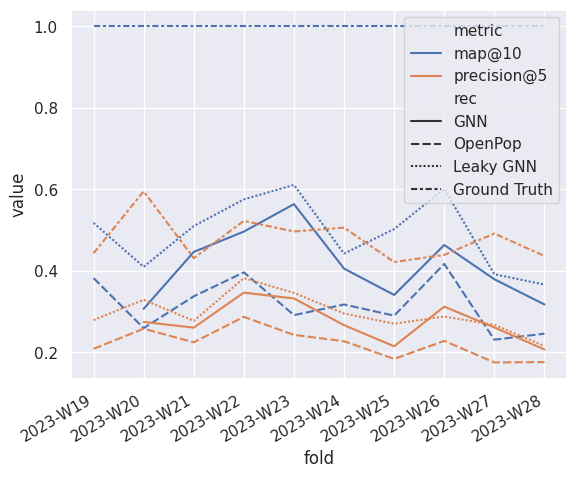

In [48]:
def plot_gnn_results(metrics2plot=cols2plot, oracle=False, perfect=None, common_only=False):
    _toplot = _get_toplot_table(metrics2plot, oracle, perfect)

    if common_only:
        _toplot = _toplot[_toplot['fold'] >= best_realistic.index.min()]

    ax = sns.lineplot(
        _toplot, x='fold_week', y='value', 
        hue='metric' if len(metrics2plot) > 1 else None, 
        style='rec',
        style_order=['GNN', 'OpenPop', _LEAK_NAME, _PERFECT_NAME],
    )
    ax.set_xlabel('fold')
    
    if len(metrics2plot) == 1:
        ax.set_ylabel(metrics2plot[0])
        ax.legend_.set_title(None)

    # ax.set_xticks(ax.get_xticks()[1:-1], _toplot_base.index.strftime('%G-W%V'), rotation=30, ha='right')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=30, ha='right')

    display(_toplot.groupby(['rec', 'metric'])['value'].describe())
    # print(_toplot.groupby(['rec', 'metric'])['value'].describe()[['mean', 'std', '50%', 'min', 'max']].to_html())

    return ax

ax = plot_gnn_results(oracle=True) # perfect=['precision@5'])
download_matplotlib(ax.figure, '09_gnn_results.pdf')

/tmp/ipykernel_3795145/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3795145/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,9.0,0.482324,0.056450,0.421622,0.436620,0.491566,0.506061,0.595266
GNN,precision@5,9.0,0.275080,0.048055,0.207042,0.260656,0.266667,0.312150,0.346535
OpenPop,precision@5,9.0,0.222521,0.038416,0.175100,0.183784,0.227273,0.242735,0.287129


Cannot show ipywidgets in text

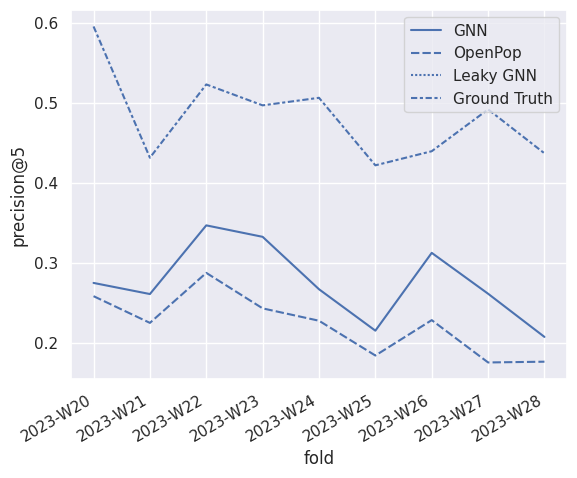

In [49]:
ax = plot_gnn_results(['precision@5'])
ax.figure.savefig('../figures/09_gnn_results_precision_5.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_precision_5.pdf')

/tmp/ipykernel_3795145/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3795145/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,precision@5,9.0,0.482324,0.056450,0.421622,0.436620,0.491566,0.506061,0.595266
Leaky GNN,precision@5,9.0,0.296725,0.049206,0.215493,0.270270,0.287850,0.328994,0.382178
GNN,precision@5,9.0,0.275080,0.048055,0.207042,0.260656,0.266667,0.312150,0.346535
OpenPop,precision@5,9.0,0.222521,0.038416,0.175100,0.183784,0.227273,0.242735,0.287129


Cannot show ipywidgets in text

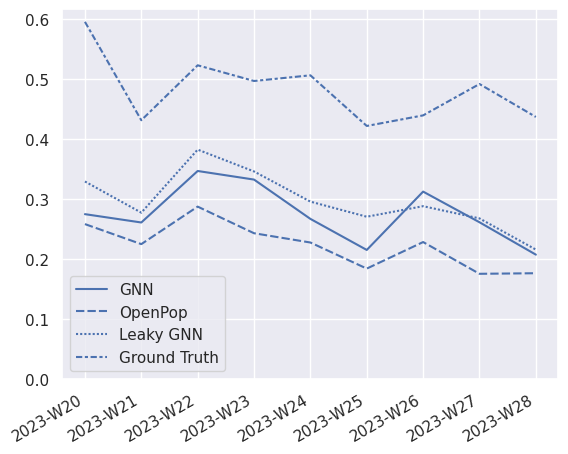

In [50]:
ax = plot_gnn_results(['precision@5'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_precision_5_leaky.pdf')

/tmp/ipykernel_3795145/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3795145/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,map@10,9.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.00000
GNN,map@10,9.0,0.413346,0.086724,0.306735,0.340873,0.405514,0.463475,0.56380
OpenPop,map@10,9.0,0.309521,0.064593,0.230983,0.259439,0.291362,0.337444,0.41701


Cannot show ipywidgets in text

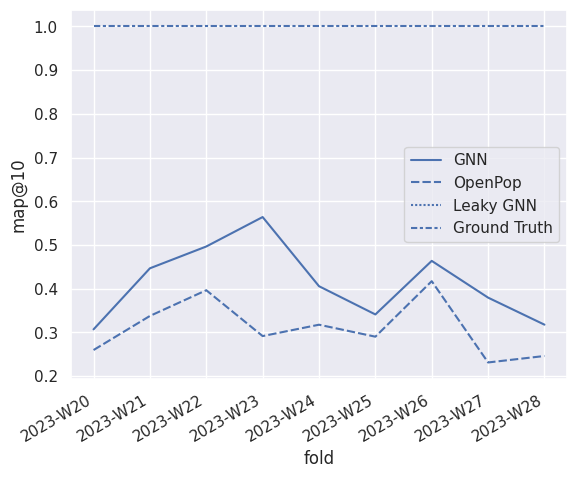

In [51]:
ax = plot_gnn_results(['map@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_map_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_map_10.pdf')

/tmp/ipykernel_3795145/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3795145/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,9.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
GNN,ndcg@10,9.0,0.521307,0.091428,0.399093,0.434555,0.528486,0.607244,0.658327
OpenPop,ndcg@10,9.0,0.411758,0.081640,0.317611,0.356482,0.406611,0.434913,0.569957


Cannot show ipywidgets in text

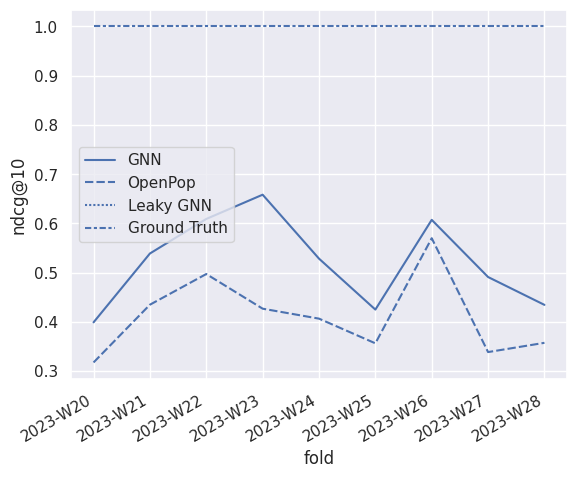

In [52]:
ax = plot_gnn_results(['ndcg@10']) #, perfect=False)
ax.figure.savefig('../figures/09_gnn_results_ndcg_10.png', bbox_inches='tight')
download_matplotlib(ax.figure, '09_gnn_results_ndcg_10.pdf')

/tmp/ipykernel_3795145/1512336908.py:20: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.

/tmp/ipykernel_3795145/1512336908.py:22: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



,,count,mean,std,min,25%,50%,75%,max
rec,metric,,,,,,,,
Ground Truth,ndcg@10,9.0,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000
Leaky GNN,ndcg@10,9.0,0.590474,0.091757,0.478141,0.505253,0.589826,0.681715,0.715657
GNN,ndcg@10,9.0,0.521307,0.091428,0.399093,0.434555,0.528486,0.607244,0.658327
OpenPop,ndcg@10,9.0,0.411758,0.081640,0.317611,0.356482,0.406611,0.434913,0.569957


Cannot show ipywidgets in text

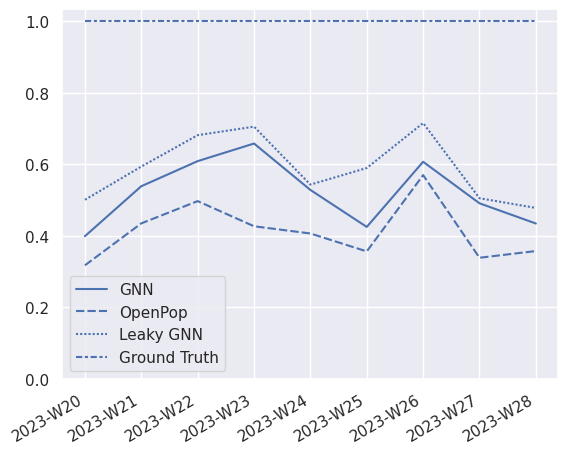

In [53]:
ax = plot_gnn_results(['ndcg@10'], oracle=True, common_only=True)

ax.set_xlabel('')
ax.set_ylabel('')
ax.set_ylim(0)

download_matplotlib(ax.figure, '09_gnn_results_ndcg_10_leaky.pdf')